In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pickle
from tools.results_functions import evaluate_system_comparison, show_dataset, get_camera_parameters, plot_LASA_S2, plot_accuracy_metrics
results_base_directory = './'

### Visualize LASA dataset

In [1]:
subplots = [6, 5]
figsize = [15, 11]
dataset_name = 'LASA'
show_dataset(dataset_name, subplots, figsize)

NameError: name 'show_dataset' is not defined

## 1) Experiments LASA

This section show that the proposed framework can successfully learn accurate and asymptotically stable motions from the LASA dataset.


###  1.1) Qualitative Comparison

In [56]:
plt.rcdefaults()
plt.rcParams.update({"text.usetex": True, 
                     "font.family": "Times New Roman", 
                     "font.size": 26,
                     "figure.figsize": (8, 9)})
dataset_name = 'LASA'
simulated_trajectory_length = 2000
density = 50
models_names = ['1st_order_2D', '1st_order_2D_euc', '1st_order_2D_boundary', '1st_order_2D_euc_boundary', '1st_order_behavioral_cloning_2D']
quanti_eval = False
quali_eval = True

In [ ]:
demos_ids = [3, 23, 25]
evaluate_system_comparison(quanti_eval, quali_eval, models_names, dataset_name, demos_ids, density, simulated_trajectory_length, results_base_directory)

### 1.2) Quantitative comparison

In [6]:
plt.rcdefaults()
plt.rcParams.update({"text.usetex": True, 
                     "font.family": "Times New Roman", 
                     "font.size": 32})
dataset_name = 'LASA'
simulated_trajectory_length = 2500
density = 50
models_names = ['1st_order_2D', '1st_order_2D_euc', '1st_order_2D_boundary', '1st_order_2D_euc_boundary', '1st_order_behavioral_cloning_2D']
quanti_eval = True
quali_eval = False
demos_ids = list(range(30))
fixed_point_iteration_thr = 1
save_name = 'quanti_metrics_LASA'

In [7]:
metrics = evaluate_system_comparison(quanti_eval, quali_eval, models_names, dataset_name, demos_ids, density, simulated_trajectory_length, results_base_directory, fixed_point_iteration_thr=fixed_point_iteration_thr, save_name=save_name)

Evaluating model: 1st_order_2D; demo: 0
Evaluating model: 1st_order_2D; demo: 1
Evaluating model: 1st_order_2D; demo: 2
Evaluating model: 1st_order_2D; demo: 3
Evaluating model: 1st_order_2D; demo: 4
Evaluating model: 1st_order_2D; demo: 5
Evaluating model: 1st_order_2D; demo: 6
Evaluating model: 1st_order_2D; demo: 7
Evaluating model: 1st_order_2D; demo: 8
Evaluating model: 1st_order_2D; demo: 9
Evaluating model: 1st_order_2D; demo: 10
Evaluating model: 1st_order_2D; demo: 11
Evaluating model: 1st_order_2D; demo: 12
Evaluating model: 1st_order_2D; demo: 13
Evaluating model: 1st_order_2D; demo: 14
Evaluating model: 1st_order_2D; demo: 15
Evaluating model: 1st_order_2D; demo: 16
Evaluating model: 1st_order_2D; demo: 17
Evaluating model: 1st_order_2D; demo: 18
Evaluating model: 1st_order_2D; demo: 19
Evaluating model: 1st_order_2D; demo: 20
Evaluating model: 1st_order_2D; demo: 21
Evaluating model: 1st_order_2D; demo: 22
Evaluating model: 1st_order_2D; demo: 23
Evaluating model: 1st_orde

#### Plot results

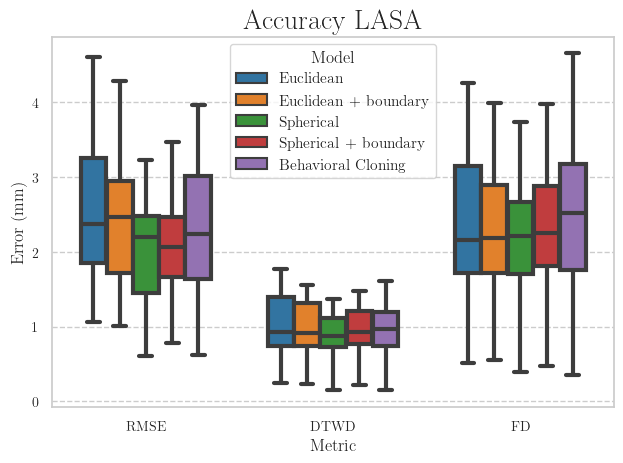

In [8]:
save_name = 'quanti_metrics_LASA'
with open(results_base_directory +  'results_analysis/saved_metrics/%s.pk' % save_name, 'rb') as input_file:
    metrics = pickle.load(input_file)
    
# Values
models_names = ['Euclidean', 'Euclidean + boundary', 'Spherical', 
                'Spherical + boundary', 'Behavioral Cloning']

metrics_names = ['RMSE', 'DTWD', 'FD']
title = 'Accuracy LASA'

metrics_models = [metrics['1st_order_2D_euc'],
                  metrics['1st_order_2D_euc_boundary'],
                  metrics['1st_order_2D'],
                  metrics['1st_order_2D_boundary'],
                  metrics['1st_order_behavioral_cloning_2D']]

# Box plot
plot_accuracy_metrics(models_names, metrics_names, metrics_models, title, results_base_directory)

In [9]:
save_name = 'quanti_metrics_LASA'
with open(results_base_directory + 'results_analysis/saved_metrics/%s.pk' % save_name, 'rb') as input_file:
    metrics = pickle.load(input_file)

n_trajectories = density**2
euclidean = np.array(metrics['1st_order_2D_euc']['n_spurious']).mean() / n_trajectories * 100
euclidean_boundary = np.array(metrics['1st_order_2D_euc_boundary']['n_spurious']).mean() / n_trajectories * 100
spherical = np.array(metrics['1st_order_2D']['n_spurious']).mean() / n_trajectories * 100
spherical_boundary = np.array(metrics['1st_order_2D_boundary']['n_spurious']).mean() / n_trajectories * 100
behavioral_cloning = np.array(metrics['1st_order_behavioral_cloning_2D']['n_spurious']).mean() / n_trajectories * 100

results = (n_trajectories, euclidean, euclidean_boundary, spherical, spherical_boundary, behavioral_cloning)

print(
    'Percentage of Unsuccessful Trajectories (%.0f trajectories):\n\n'
    'Euclidean: %f%% \n' 
    'Euclidean boundary: %f%% \n'
    'Spherical: %f%% \n'
    'Spherical boundary: %f%% \n'
    'Behavioral cloning: %f%% \n' % results 
    )

Percentage of Unsuccessful Trajectories (2500 trajectories):

Euclidean: 0.000000% 
Euclidean boundary: 0.000000% 
Spherical: 0.000000% 
Spherical boundary: 0.000000% 
Behavioral cloning: 34.749333% 



## 2) Experiments LASA S2

### 2.1) Circle distance

In [17]:
dataset_name = 'LASA_S2'
model_name = '1st_order_S2'

#### Get camera parameters

In [60]:
demo_id = 1
model = 36000
get_camera_parameters(dataset_name, model_name, demo_id, model)

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app '__main__'
 * Debug mode: on


#### Plot S2 learned models

In [15]:
demo_id = 3
model = 41000

camera = dict(
    eye=dict(x=-0.3867641339055873, y=-0.6413379069260574, z=1.2511279104657411),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

In [18]:
demo_id = 20
model = 23000

camera = dict(
    eye=dict(x=0.729991658758739, y=0.5637176015592403, z=0.8742963291495074),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

In [24]:
demo_id = 22
model = 36000

camera = dict(
    eye=dict(x=-0.8638573933478987, y=-0.766267629069433, z=0.7275651938144199),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

### 2.2) LASA S2 Euclidean distance

In [16]:
dataset_name = 'LASA_S2'
model_name = '1st_order_S2_euc'

#### Plot S2 learned models

In [16]:
demo_id = 3
model = 41000

camera = dict(
    eye=dict(x=-0.3867641339055873, y=-0.6413379069260574, z=1.2511279104657411),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

In [17]:
demo_id = 20
model = 23000

camera = dict(
    eye=dict(x=0.729991658758739, y=0.5637176015592403, z=0.8742963291495074),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

In [19]:
demo_id = 22
model = 36000

camera = dict(
    eye=dict(x=-0.8638573933478987, y=-0.766267629069433, z=0.7275651938144199),
    center=dict(x=0, y=0, z=0),
    up=dict(x=0, y=0, z=1)
)

plot_LASA_S2(dataset_name, model_name, demo_id, model, camera)

### 2.3) Quantitative comparison

In [51]:
plt.rcdefaults()
plt.rcParams.update({"text.usetex": True, 
                     "font.family": "Times New Roman", 
                     "font.size": 32})
dataset_name = 'LASA_S2'
simulated_trajectory_length = 2500
density = 50
models_names = ['1st_order_S2', '1st_order_S2_euc', '1st_order_behavioral_cloning_S2']
quanti_eval = True
quali_eval = False
demos_ids = list(range(24))
fixed_point_iteration_thr = 0.06
save_name = 'quanti_metrics_LASA_S2'

In [52]:
metrics = evaluate_system_comparison(quanti_eval, quali_eval, models_names, dataset_name, demos_ids, density, simulated_trajectory_length, results_base_directory, fixed_point_iteration_thr=fixed_point_iteration_thr, save_name=save_name)

Evaluating model: 1st_order_S2; demo: 0
Evaluating model: 1st_order_S2; demo: 1
Evaluating model: 1st_order_S2; demo: 2
Evaluating model: 1st_order_S2; demo: 3
Evaluating model: 1st_order_S2; demo: 4
Evaluating model: 1st_order_S2; demo: 5
Evaluating model: 1st_order_S2; demo: 6
Evaluating model: 1st_order_S2; demo: 7
Evaluating model: 1st_order_S2; demo: 8
Evaluating model: 1st_order_S2; demo: 9
Evaluating model: 1st_order_S2; demo: 10
Evaluating model: 1st_order_S2; demo: 11
Evaluating model: 1st_order_S2; demo: 12
Evaluating model: 1st_order_S2; demo: 13
Evaluating model: 1st_order_S2; demo: 14
Evaluating model: 1st_order_S2; demo: 15
Evaluating model: 1st_order_S2; demo: 16
Evaluating model: 1st_order_S2; demo: 17
Evaluating model: 1st_order_S2; demo: 18
Evaluating model: 1st_order_S2; demo: 19
Evaluating model: 1st_order_S2; demo: 20
Evaluating model: 1st_order_S2; demo: 21
Evaluating model: 1st_order_S2; demo: 22
Evaluating model: 1st_order_S2; demo: 23
Evaluating model: 1st_orde

#### Plot results

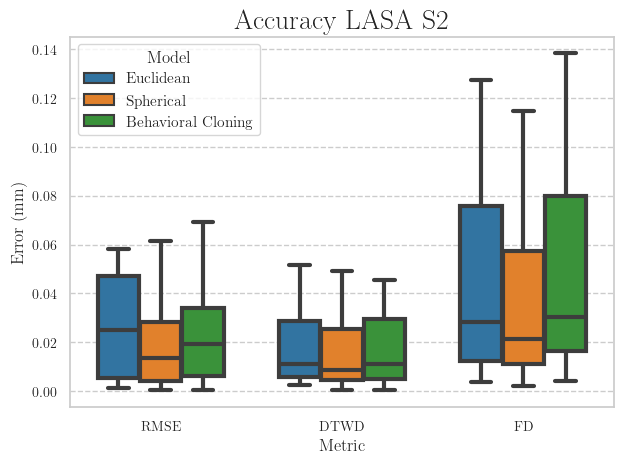

In [53]:
save_name = 'quanti_metrics_LASA_S2'
with open(results_base_directory + 'results_analysis/saved_metrics/%s.pk' % save_name, 'rb') as input_file:
    metrics = pickle.load(input_file)
    
# Values
models_names = ['Euclidean', 'Spherical', 'Behavioral Cloning']

metrics_names = ['RMSE', 'DTWD', 'FD']
title = 'Accuracy LASA S2'

metrics_models = [metrics['1st_order_S2_euc'],
                  metrics['1st_order_S2'],
                  metrics['1st_order_behavioral_cloning_S2']]

# Box plot
plot_accuracy_metrics(models_names, metrics_names, metrics_models, title, results_base_directory)

In [54]:
save_name = 'quanti_metrics_LASA_S2'
with open(results_base_directory + 'results_analysis/saved_metrics/%s.pk' % save_name, 'rb') as input_file:
    metrics = pickle.load(input_file)

n_trajectories = density**2
euclidean = np.array(metrics['1st_order_S2_euc']['n_spurious']).mean() / n_trajectories * 100
spherical = np.array(metrics['1st_order_S2']['n_spurious']).mean() / n_trajectories * 100
behavioral_cloning = np.array(metrics['1st_order_behavioral_cloning_S2']['n_spurious']).mean() / n_trajectories * 100

results = (n_trajectories, euclidean, spherical, behavioral_cloning)

print(
    'Percentage of Unsuccessful Trajectories (%.0f trajectories):\n\n'
    'Euclidean: %f%% \n'
    'Spherical: %f%% \n'
    'Behavioral cloning: %f%% \n' % results 
    )

Percentage of Unsuccessful Trajectories (2500 trajectories):

Euclidean: 0.000000% 
Spherical: 0.000000% 
Behavioral cloning: 32.950000% 



### LAIR

#### Qualitative comparison

In [2]:
plt.rcdefaults()
plt.rcParams.update({"text.usetex": True, 
                     "font.family": "Times New Roman", 
                     "font.size": 32})
dataset_name = 'LAIR'
simulated_trajectory_length = 1500
density = 10
models_names = ['2nd_order_2D', '2nd_order_2D_euc', '2nd_order_behavioral_cloning_2D']
quanti_eval = False
quali_eval = True
demos_ids = [3, 4, 9]

Saving image to results_analysis/LAIR_2nd_order_2D_3.pdf...


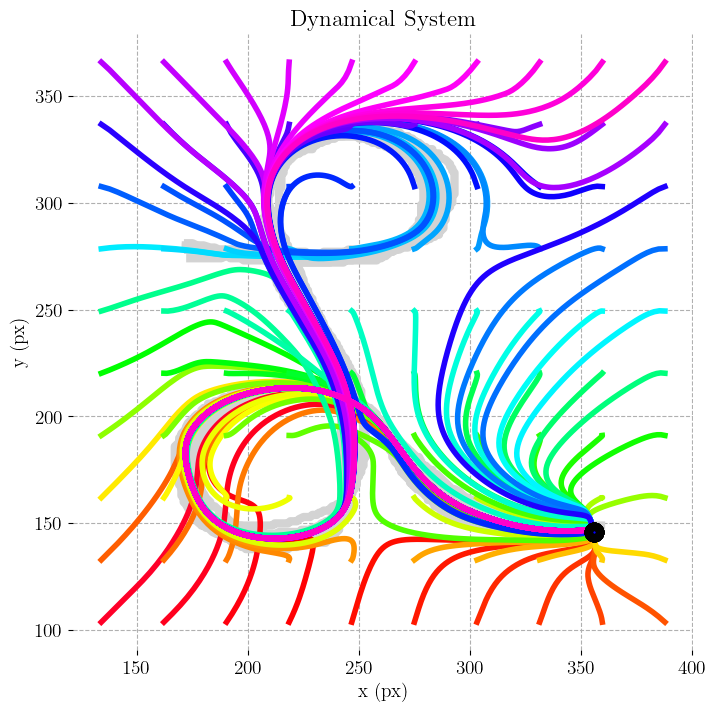

Saving image to results_analysis/LAIR_2nd_order_2D_4.pdf...


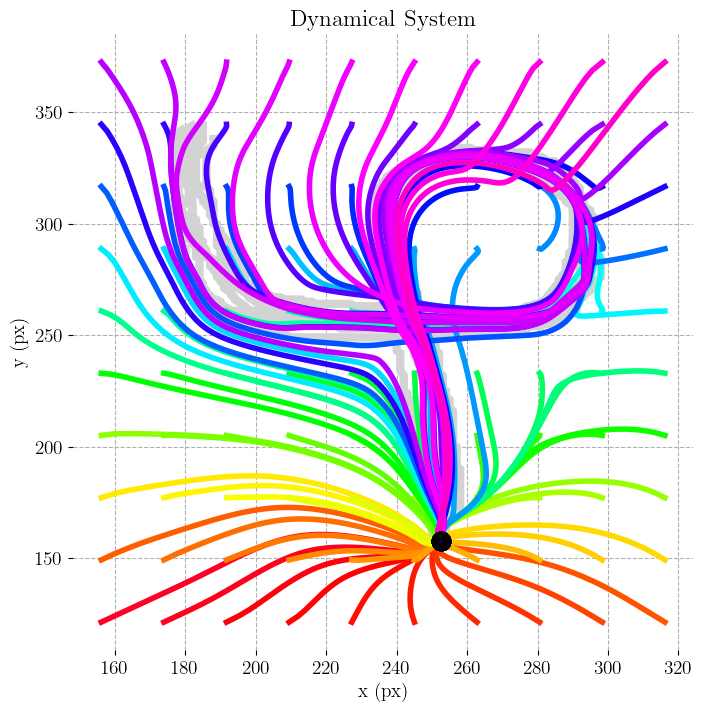

Saving image to results_analysis/LAIR_2nd_order_2D_9.pdf...


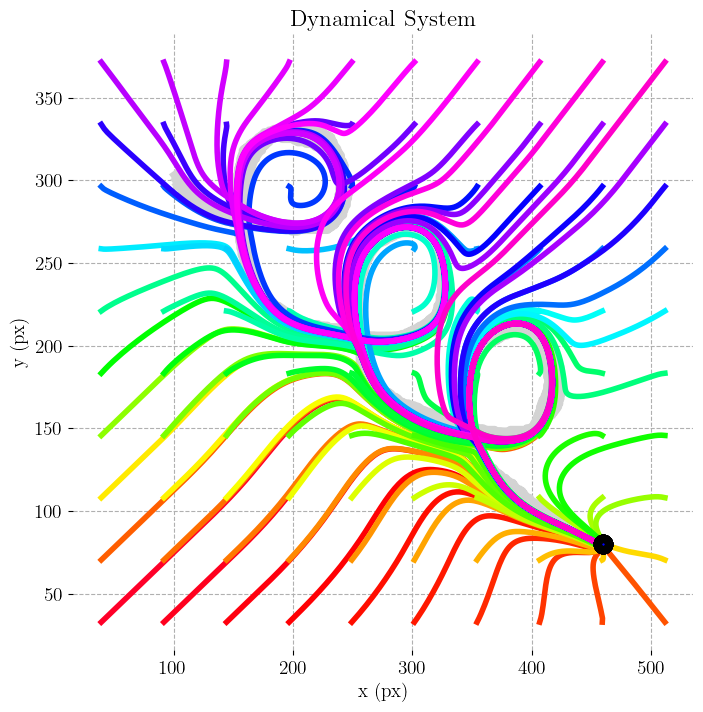

Saving image to results_analysis/LAIR_2nd_order_2D_euc_3.pdf...


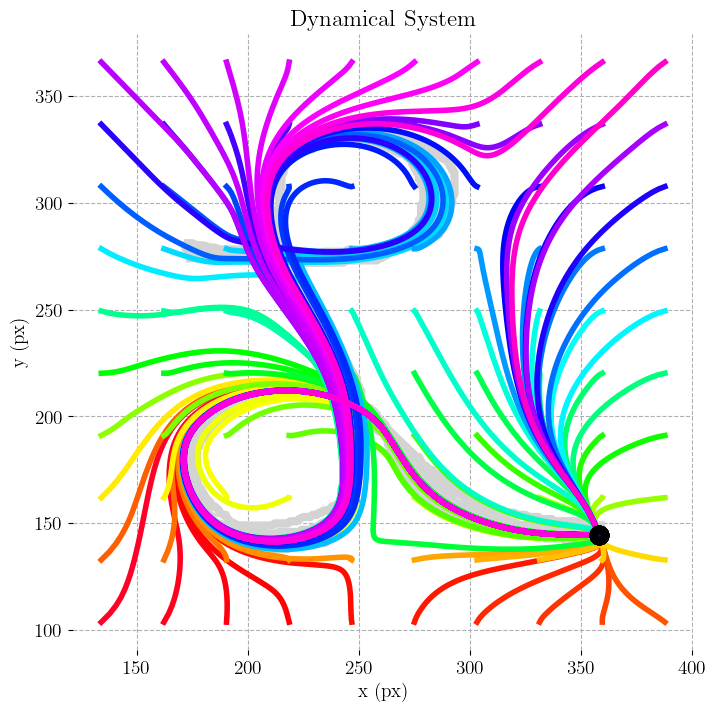

Saving image to results_analysis/LAIR_2nd_order_2D_euc_4.pdf...


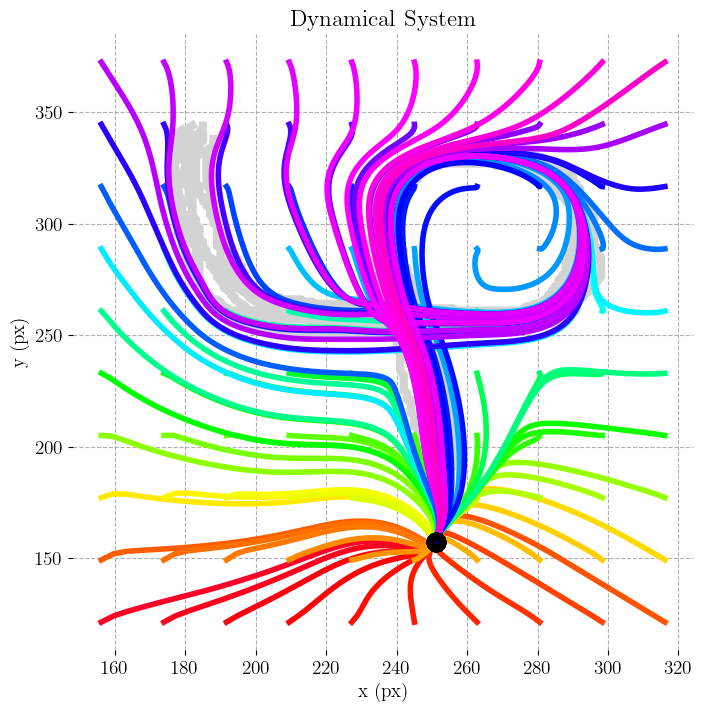

Saving image to results_analysis/LAIR_2nd_order_2D_euc_9.pdf...


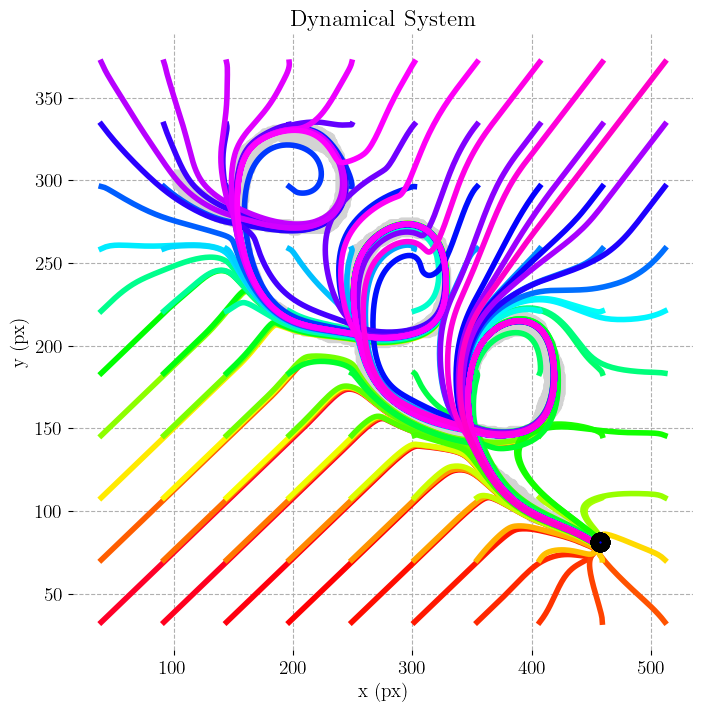

Saving image to results_analysis/LAIR_2nd_order_behavioral_cloning_2D_3.pdf...


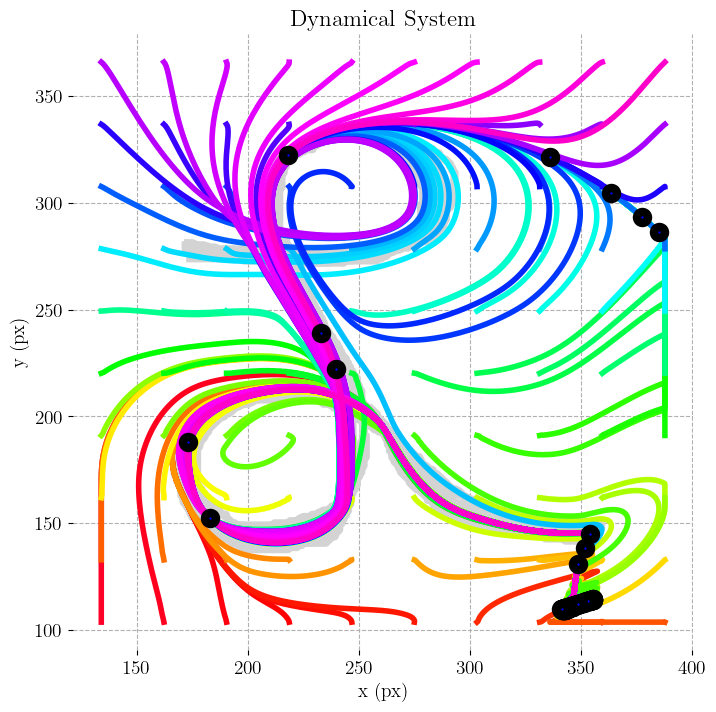

Saving image to results_analysis/LAIR_2nd_order_behavioral_cloning_2D_4.pdf...


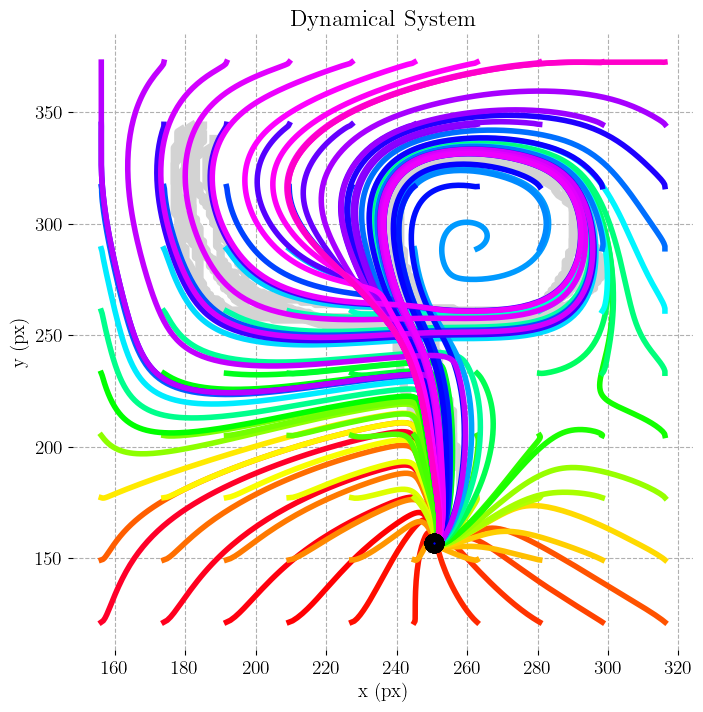

Saving image to results_analysis/LAIR_2nd_order_behavioral_cloning_2D_9.pdf...


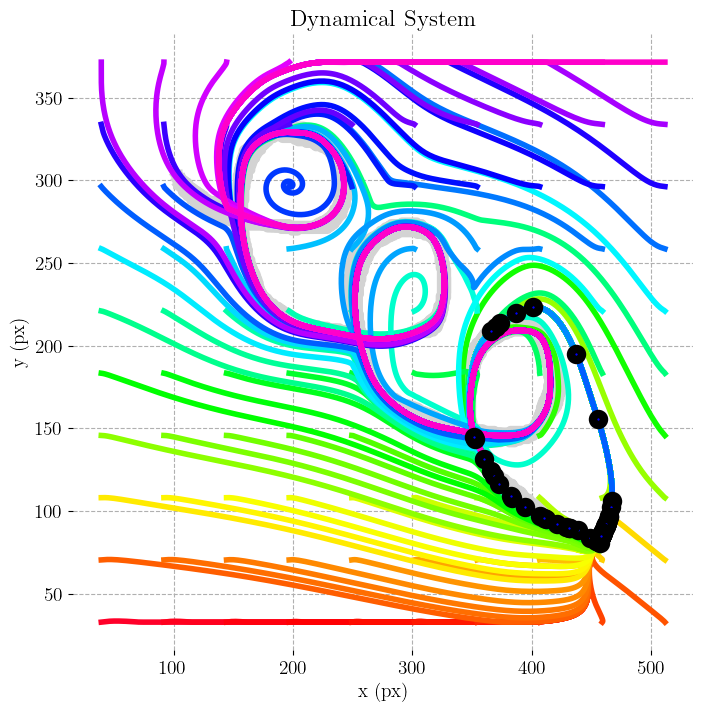

{'2nd_order_2D': {'RMSE': [], 'DTWD': [], 'FD': [], 'n_spurious': []},
 '2nd_order_2D_euc': {'RMSE': [], 'DTWD': [], 'FD': [], 'n_spurious': []},
 '2nd_order_behavioral_cloning_2D': {'RMSE': [],
  'DTWD': [],
  'FD': [],
  'n_spurious': []}}

In [3]:
evaluate_system_comparison(quanti_eval, quali_eval, models_names, dataset_name, demos_ids, density, simulated_trajectory_length, results_base_directory)

#### Quantitative comparison LAIR

In [3]:
plt.rcdefaults()
plt.rcParams.update({"text.usetex": True, 
                     "font.family": "Times New Roman", 
                     "font.size": 32})
dataset_name = 'LAIR'
simulated_trajectory_length = 1500
density = 50
models_names = ['2nd_order_2D', '2nd_order_2D_euc', '2nd_order_behavioral_cloning_2D']
quanti_eval = True
quali_eval = False
demos_ids = list(range(10))
fixed_point_iteration_thr = 10
save_name = 'quanti_metrics_LAIR'

In [4]:
metrics = evaluate_system_comparison(quanti_eval, quali_eval, models_names, dataset_name, demos_ids, density, simulated_trajectory_length, results_base_directory, fixed_point_iteration_thr=fixed_point_iteration_thr, save_name=save_name)

Evaluating model: 2nd_order_2D; demo: 0
Evaluating model: 2nd_order_2D; demo: 1
Evaluating model: 2nd_order_2D; demo: 2
Evaluating model: 2nd_order_2D; demo: 3
Evaluating model: 2nd_order_2D; demo: 4
Evaluating model: 2nd_order_2D; demo: 5
Evaluating model: 2nd_order_2D; demo: 6
Evaluating model: 2nd_order_2D; demo: 7
Evaluating model: 2nd_order_2D; demo: 8
Evaluating model: 2nd_order_2D; demo: 9
Evaluating model: 2nd_order_2D_euc; demo: 0
Evaluating model: 2nd_order_2D_euc; demo: 1
Evaluating model: 2nd_order_2D_euc; demo: 2
Evaluating model: 2nd_order_2D_euc; demo: 3
Evaluating model: 2nd_order_2D_euc; demo: 4
Evaluating model: 2nd_order_2D_euc; demo: 5
Evaluating model: 2nd_order_2D_euc; demo: 6
Evaluating model: 2nd_order_2D_euc; demo: 7
Evaluating model: 2nd_order_2D_euc; demo: 8
Evaluating model: 2nd_order_2D_euc; demo: 9
Evaluating model: 2nd_order_behavioral_cloning_2D; demo: 0
Evaluating model: 2nd_order_behavioral_cloning_2D; demo: 1
Evaluating model: 2nd_order_behavioral_clo

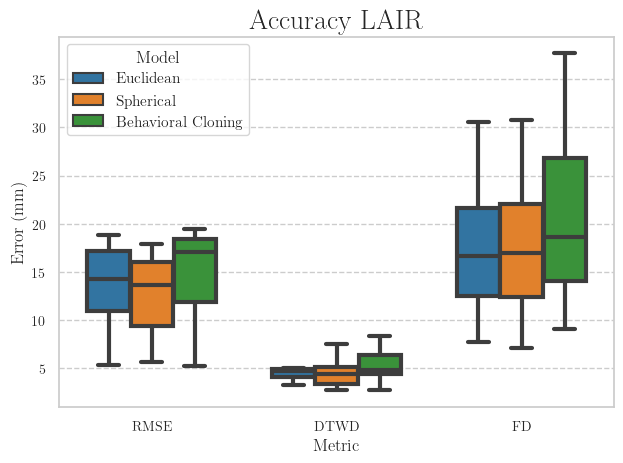

In [5]:
with open(results_base_directory + 'results_analysis/saved_metrics/%s.pk' % save_name, 'rb') as input_file:
    metrics = pickle.load(input_file)
    
# Values
models_names = ['Euclidean', 'Spherical', 'Behavioral Cloning']

metrics_names = ['RMSE', 'DTWD', 'FD']
title = 'Accuracy LAIR'

metrics_models = [metrics['2nd_order_2D_euc'],
                  metrics['2nd_order_2D'],
                  metrics['2nd_order_behavioral_cloning_2D']]

# Box plot
plot_accuracy_metrics(models_names, metrics_names, metrics_models, title, results_base_directory)

In [13]:
with open(results_base_directory + 'results_analysis/saved_metrics/%s.pk' % save_name, 'rb') as input_file:
    metrics = pickle.load(input_file)

n_trajectories = density**2
spherical = np.array(metrics['2nd_order_2D']['n_spurious']).mean() / n_trajectories * 100
euclidean = np.array(metrics['2nd_order_2D_euc']['n_spurious']).mean() / n_trajectories * 100
behavioral_cloning = np.array(metrics['2nd_order_behavioral_cloning_2D']['n_spurious']).mean() / n_trajectories * 100

results = (n_trajectories, spherical, euclidean, behavioral_cloning)

print(
    'Percentage of Unsuccessful Trajectories (%.0f trajectories):\n\n'
    'Spherical: %f%% \n' 
    'Euclidean: %f%% \n' 
    'Behavioral cloning: %f%% \n' % results 
    )

Percentage of Unsuccessful Trajectories (2500 trajectories):

Spherical: 0.000000% 
Euclidean: 0.000000% 
Behavioral cloning: 53.644000% 



In [7]:
n_trajectories

2500